# SET DE DATOS

En este proyecto se trabajaran con variables atmosféricas y meteorológicas de estaciones en tierra en Alemania.
 
- Continen 18 diferentes variables como, temperatura a dos metros (t2m_obs), energia poetencial convectiva disponible(cape), presión supercial (sp), cubierta total de nuebes (tcc), entre otras.
- Estas variables son promedios díarios de 537 estaciones y la variable target.
- Se recolectaron para un periodo de 6 años.

In [1]:
import pandas as pd 
import numpy as np
import seaborn as sb
import matplotlib.pyplot as plt


In [133]:
df_train = pd.read_csv('pp_train.csv', index_col=0)
df_test = pd.read_csv('pp_test.csv', index_col=0)
df_train['time'] = pd.to_datetime(df_train['time'])
df_test['time'] = pd.to_datetime(df_test['time'])
df_train.set_index('time',inplace=True)
df_test.set_index('time',inplace=True)

A continuación se muestra la estructura de los valores y medidas de posición, dispersión y simetria

In [3]:
df_train.info("all")

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 980562 entries, 2011-01-01 to 2015-12-31
Data columns (total 24 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   t2m_obs           908857 non-null  float64
 1   station           980562 non-null  int64  
 2   t2m_fc_mean       980562 non-null  float64
 3   orog              980562 non-null  float64
 4   station_alt       980562 non-null  float64
 5   station_lat       980562 non-null  float64
 6   station_lon       980562 non-null  float64
 7   u_pl500_fc_mean   980562 non-null  float64
 8   v_pl500_fc_mean   980562 non-null  float64
 9   gh_pl500_fc_mean  980562 non-null  float64
 10  u_pl850_fc_mean   980562 non-null  float64
 11  v_pl850_fc_mean   980562 non-null  float64
 12  q_pl850_fc_mean   980562 non-null  float64
 13  cape_fc_mean      980562 non-null  float64
 14  sp_fc_mean        980562 non-null  float64
 15  tcc_fc_mean       980562 non-null  float64
 16  sshf

In [4]:
df_test.info("all")

<class 'pandas.core.frame.DataFrame'>
DatetimeIndex: 182218 entries, 2016-01-01 to 2016-12-31
Data columns (total 23 columns):
 #   Column            Non-Null Count   Dtype  
---  ------            --------------   -----  
 0   station           182218 non-null  int64  
 1   t2m_fc_mean       182218 non-null  float64
 2   orog              182218 non-null  float64
 3   station_alt       182218 non-null  float64
 4   station_lat       182218 non-null  float64
 5   station_lon       182218 non-null  float64
 6   u_pl500_fc_mean   182218 non-null  float64
 7   v_pl500_fc_mean   182218 non-null  float64
 8   gh_pl500_fc_mean  182218 non-null  float64
 9   u_pl850_fc_mean   182218 non-null  float64
 10  v_pl850_fc_mean   182218 non-null  float64
 11  q_pl850_fc_mean   182218 non-null  float64
 12  cape_fc_mean      182218 non-null  float64
 13  sp_fc_mean        182218 non-null  float64
 14  tcc_fc_mean       182218 non-null  float64
 15  sshf_fc_mean      182218 non-null  float64
 16  slhf

In [5]:
pd.set_option('display.float_format', lambda x: '%.2f' % x)
df_train.describe().T

,count,mean,std,min,25%,50%,75%,max
t2m_obs,908857.00,7.53,6.58,-26.20,2.80,7.80,12.50,30.40
station,980562.00,3726.73,2719.50,3.00,1639.00,3348.00,5277.00,15555.00
t2m_fc_mean,980562.00,7.31,6.72,-21.51,2.33,7.68,12.49,26.24
orog,980562.00,295.23,234.16,-1.43,67.39,296.44,436.71,1268.07
station_alt,980562.00,289.70,278.96,0.00,72.00,238.00,440.00,2964.00
station_lat,980562.00,50.81,1.92,47.40,49.24,50.74,52.18,55.01
station_lon,980562.00,10.18,2.08,6.02,8.58,10.05,11.81,14.95
u_pl500_fc_mean,980562.00,8.82,10.80,-34.02,1.47,8.57,15.72,53.23
v_pl500_fc_mean,980562.00,-0.30,10.91,-51.87,-6.88,0.30,7.20,37.15
gh_pl500_fc_mean,980562.00,5607.32,148.72,4976.94,5507.76,5629.72,5719.49,5940.68


In [6]:
df_test.describe().T

,count,mean,std,min,25%,50%,75%,max
station,182218.00,3726.97,2675.14,44.00,1645.00,3362.00,5280.00,15555.00
t2m_fc_mean,182218.00,7.49,6.72,-21.57,1.88,7.04,13.46,23.76
orog,182218.00,295.86,233.73,-1.43,66.49,296.44,436.94,1268.07
station_alt,182218.00,290.21,274.89,0.00,70.00,240.00,443.00,2964.00
station_lat,182218.00,50.81,1.91,47.40,49.24,50.73,52.21,55.01
station_lon,182218.00,10.25,2.09,6.02,8.64,10.17,11.88,14.95
u_pl500_fc_mean,182218.00,8.52,10.64,-30.60,1.77,7.95,14.96,58.53
v_pl500_fc_mean,182218.00,-0.80,10.35,-47.70,-7.08,-0.16,6.05,34.92
gh_pl500_fc_mean,182218.00,5604.43,159.33,5135.72,5499.19,5630.70,5720.52,5942.31
u_pl850_fc_mean,182218.00,4.43,7.36,-19.00,-0.35,4.21,8.89,34.70


Los datos trabajados tiene la siguiente forma, donde los datos de train no tienen la variable objetivo o target

In [7]:
print(df_test.shape)
print(df_train.shape)
print(df_train.columns.values)

(182218, 23)
(980562, 24)
['t2m_obs' 'station' 't2m_fc_mean' 'orog' 'station_alt' 'station_lat'
 'station_lon' 'u_pl500_fc_mean' 'v_pl500_fc_mean' 'gh_pl500_fc_mean'
 'u_pl850_fc_mean' 'v_pl850_fc_mean' 'q_pl850_fc_mean' 'cape_fc_mean'
 'sp_fc_mean' 'tcc_fc_mean' 'sshf_fc_mean' 'slhf_fc_mean' 'u10_fc_mean'
 'v10_fc_mean' 'ssr_fc_mean' 'str_fc_mean' 'd2m_fc_mean' 'sm_fc_mean']


Distribución de las variables observadas

<Axes: xlabel='t2m_obs', ylabel='Count'>

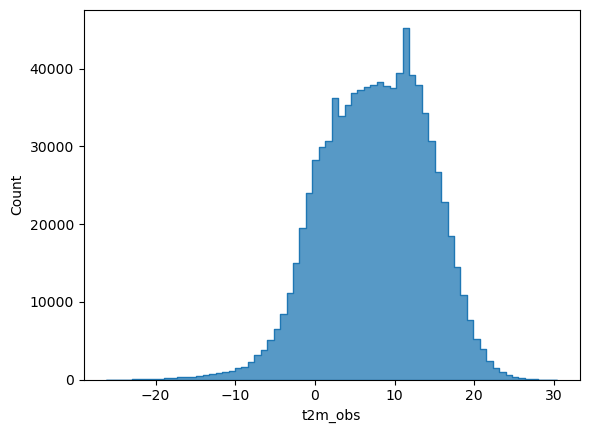

In [8]:
# df_train[::1000].loc[:,['ssr_fc_mean']].plot(kind="hist", bins=80,xlabel="Temperatura", colormap="rainbow",figsize=(20,15))
# df_train[::1000].plot(kind="hist", bins=80,xlabel="Temperatura", colormap="rainbow",figsize=(20,15))
sb.histplot(df_train.t2m_obs, bins=70, element='step')
# df_train.t2m_obs.hist(bins=50)

De una forma generalizada podemos apreciar las relaciones encontradas entre las diferentes variables del dataframe

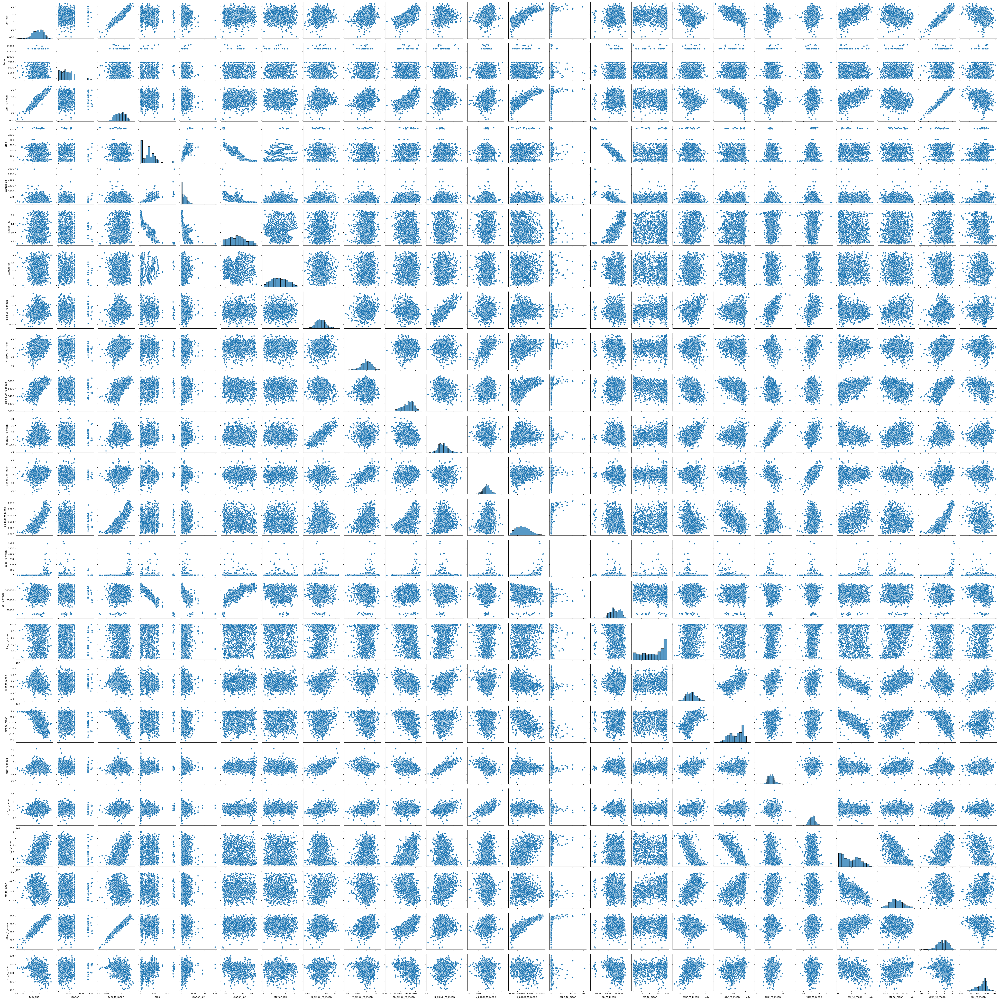

In [9]:
sb.pairplot(df_train[::1000])

c:\Users\Yesid\anaconda3\Lib\site-packages\statsmodels\graphics\tsaplots.py:348: FutureWarning: The default method 'yw' can produce PACF values outside of the [-1,1] interval. After 0.13, the default will change tounadjusted Yule-Walker ('ywm'). You can use this method now by setting method='ywm'.
  warnings.warn(


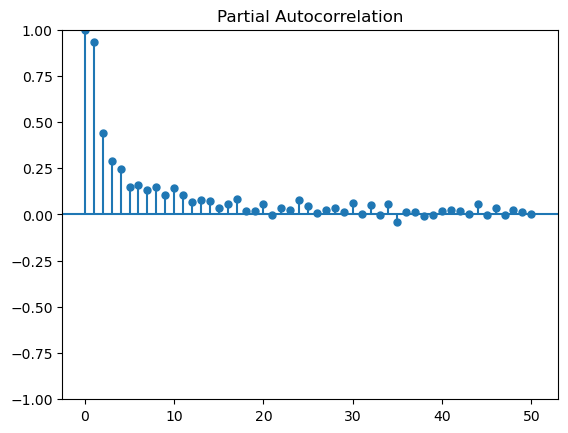

In [10]:
# Autoccorelación  parcial de los datos

from statsmodels.graphics.tsaplots import plot_pacf

plot_pacf(df_train.loc[:,['t2m_fc_mean']], lags=50)
plt.show()

### Etapa de limpieza de datos

In [11]:
df_train.isna().sum()

t2m_obs             71705
station                 0
t2m_fc_mean             0
orog                    0
station_alt             0
station_lat             0
station_lon             0
u_pl500_fc_mean         0
v_pl500_fc_mean         0
gh_pl500_fc_mean        0
u_pl850_fc_mean         0
v_pl850_fc_mean         0
q_pl850_fc_mean         0
cape_fc_mean            0
sp_fc_mean              0
tcc_fc_mean             0
sshf_fc_mean            0
slhf_fc_mean            0
u10_fc_mean             0
v10_fc_mean             0
ssr_fc_mean             0
str_fc_mean             0
d2m_fc_mean             0
sm_fc_mean          93962
dtype: int64

In [189]:
print(df_test.loc['2016-01-05',['station']].nunique())
print(df_train.loc['2011-12-07',['station']].nunique())

station    497
dtype: int64
station    505
dtype: int64


In [135]:
df_train.station.nunique()

537

Para el caso de los target se opta por eliminar los registros ya que al ser la variable a predecir no es adecuado en este caso optar por por metodologías de interpolación, que terminarian inventando datos, adicionalmente es la variable de la que se desea "aprender"

In [170]:
df_train = df_train.dropna(subset=['t2m_obs'])
# Replace missing soil moisture values with mean value
df_train.loc[:, 'sm_fc_mean'].replace(np.nan, df_train['sm_fc_mean'].mean(), inplace=True)
# Same for test dataset, using the training values
df_test.loc[:, 'sm_fc_mean'].replace(np.nan, df_train['sm_fc_mean'].mean(), inplace=True)   

C:\Users\Yesid\AppData\Local\Temp\ipykernel_6784\3222584846.py:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_train.loc[:, 'sm_fc_mean'].replace(np.nan, df_train['sm_fc_mean'].mean(), inplace=True)


In [187]:
df_train.station.nunique()

520

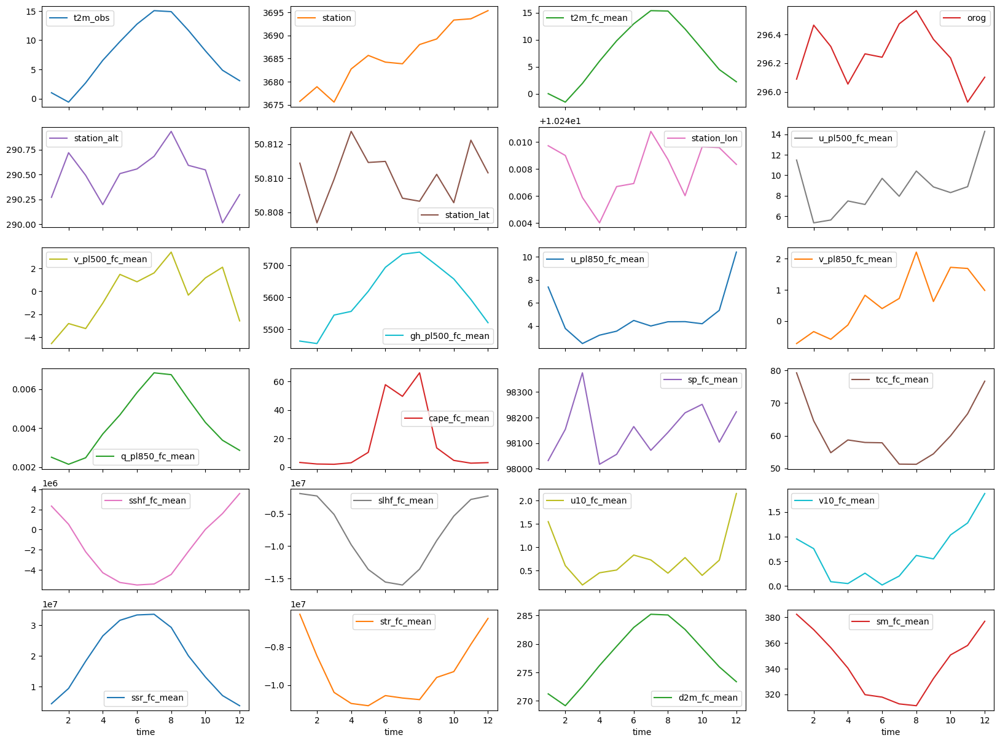

In [17]:
df_train.groupby(df_train.index.month).mean().plot(subplots=True, layout=(6,4) ,figsize=(20,20))
plt.show()

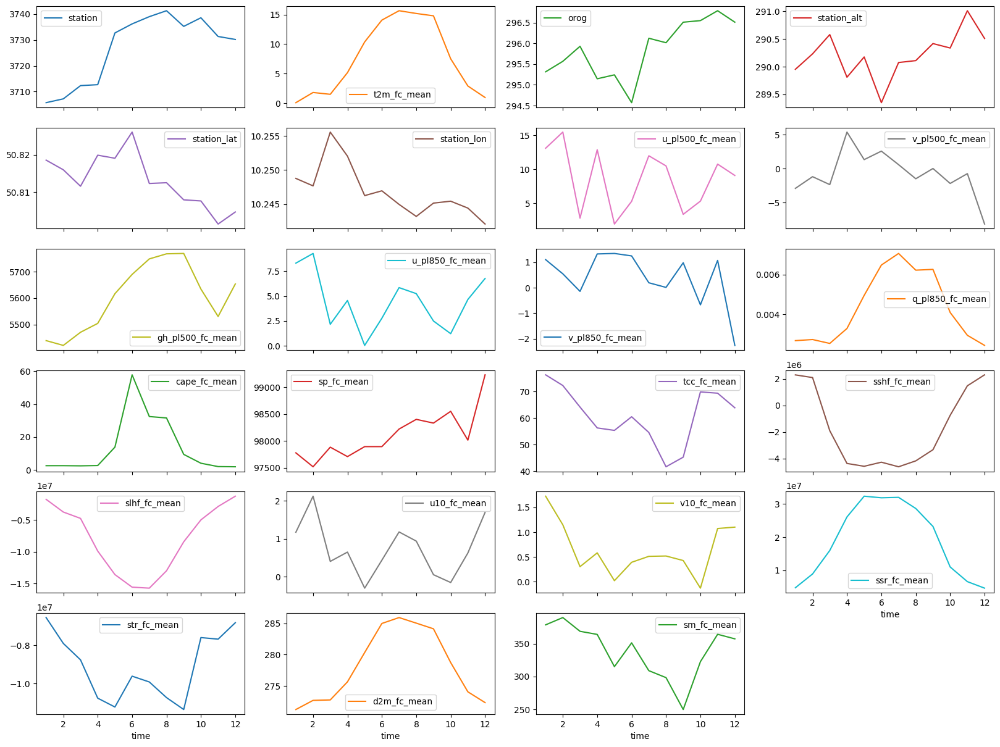

In [68]:
df_test.groupby(df_test.index.month).mean().plot(subplots=True, layout=(6,4) ,figsize=(20,20))
plt.show()

En los gráficos generados , se mira una medida de centralidad , calculando el promedio del ciclo anual en las diferentes variables , en este caso, los cambios mas significativos para muchas de las variables se centran en los meses de junio, julio, agosto y septiempre , que son los meses correspondientes a la estación de primavera , y este comportamiento se evidencia alli 

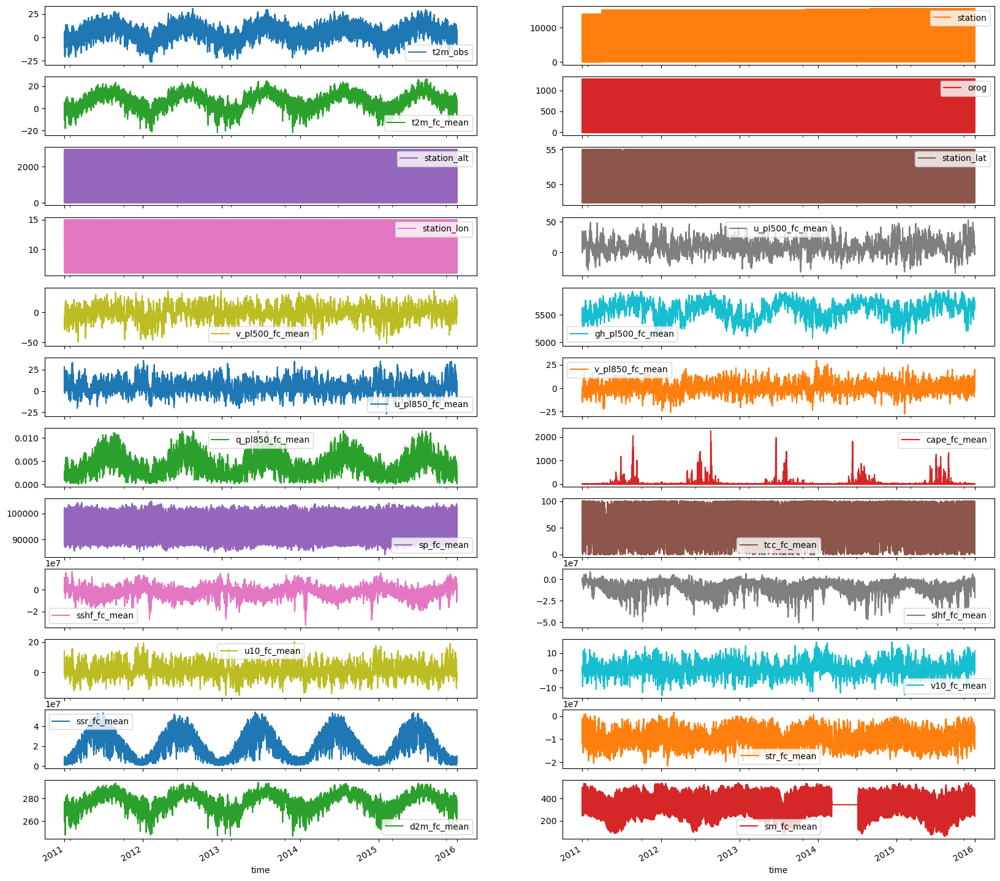

In [26]:
df_train.plot(subplots=True, layout=(12,2) ,figsize=(20,20))
plt.show()

In [173]:
df_train.shape

(908857, 24)

No hay diferencias de frecuencia de captura de datos , son diarios.

In [186]:
df_timeDiffTR=df_train.index.to_series().diff()
df_timeDiffTS=df_test.index.to_series().diff()
print(df_timeDiffTR.value_counts())
print(df_timeDiffTS.value_counts())

0 days    907031
1 days      1825
Name: time, dtype: int64
0 days    181852
1 days       365
Name: time, dtype: int64


In [190]:
#Se guarda los datos con las modificaciones realizadas

df_train.to_csv('trainpp.cvs')
df_test.to_csv('testpp.csv')